In [42]:
from functools import partial
from typing import *
import os

import numpy as np
import torch
from torch import Tensor
import transformers
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sts

import llminference as L
from transformers.models.llama.modeling_llama import LlamaForCausalLM
from transformers.models.llama.modeling_llama import LlamaAttention

torch.set_num_threads(32)

sns.set_context("paper", font_scale=1.5)
matplotlib.rc('font', **{'family': 'serif', 'serif': ["CMU Serif"]})
matplotlib.rc('text', usetex=True)
matplotlib.font_manager.findfont("CMU Serif", rebuild_if_missing=True)

findfont: Font family ['CMU Serif'] not found. Falling back to DejaVu Sans.


'/nethome/ivanc/llms/llmenv/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'

## Pythia setup

In [45]:
adapter = L.Adapter.from_pretrained("EleutherAI/pythia-1.4b")
data = L.tasks.qa.SQuAD.data()
examples = [L.tasks.qa.add_few_shot_prompt(data[i], k=1, prompt_template=L.tasks.qa.get_default_prompt_template(adapter.model.config._name_or_path, shots=1))
    for i in range(100)]

In [46]:
tensor_paths = ["/nethome/ivanc/sparq_paper/Q_pythia_1p4b", 
                "/nethome/ivanc/sparq_paper/K_pythia_1p4b", 
                "/nethome/ivanc/sparq_paper/M_pythia_1p4b"]
if False: #all([os.path.exists(p) for p in tensor_paths]):
    Q = torch.load("/nethome/ivanc/sparq_paper/Q_pythia_1p4b")
    K = torch.load("/nethome/ivanc/sparq_paper/K_pythia_1p4b")
    M = torch.load("/nethome/ivanc/sparq_paper/M_pythia_1p4b")
else:
    log_q = {}
    log_k = {}
    log_m = {}
    def logging_attn(layer_idx, self, query, key, value, attention_mask=None, head_mask=None):
        q = torch.nn.functional.pad(query, [0, 0, 2048 - query.shape[2], 0, 0, 0, 0, 0])
        k = torch.nn.functional.pad(key, [0, 0, 2048 - key.shape[2], 0, 0, 0, 0, 0])
        m = torch.nn.functional.pad(attention_mask, [2048 - key.shape[2], 0, 0, 0, 0, 0], value=-1e9)
        print(m.shape)
        log_q[layer_idx] = torch.concat([log_q[layer_idx], q], axis=0) if layer_idx in log_q else q
        log_k[layer_idx] = torch.concat([log_k[layer_idx], k], axis=0) if layer_idx in log_k else k
        log_m[layer_idx] = torch.concat([log_m[layer_idx], m], axis=0) if layer_idx in log_m else m
        return transformers.models.gpt_neox.modeling_gpt_neox.GPTNeoXAttention._attn(
            self, query, key, value, attention_mask=attention_mask, head_mask=head_mask)
        
    for layer_idx, layer in enumerate(adapter.model.gpt_neox.layers):
        layer.attention._attn = partial(logging_attn, layer_idx, layer.attention)

    out = list(L.tasks.qa.evaluate(adapter, examples[:1], batch_size=1, output_token_limit=1))
    
    # Q = torch.stack(list(log_q.values())).swapaxes(0, 1)[..., -1:, :]
    # K = torch.stack(list(log_k.values())).swapaxes(0, 1)
    # M = torch.stack(list(log_m.values())).swapaxes(0, 1)

    # torch.save(Q, "/nethome/ivanc/sparq_paper/Q_pythia_1p4b")
    # torch.save(K, "/nethome/ivanc/sparq_paper/K_pythia_1p4b")
    # torch.save(M, "/nethome/ivanc/sparq_paper/M_pythia_1p4b")

# def attention_weight(q: Tensor, k: Tensor, mask: Tensor) -> Tensor:
#     a = (q @ k.transpose(-1, -2)).mul_(q.shape[-1]**-0.5).add_(mask)
#     return torch.nn.functional.softmax(a, dim=-1)
# A = attention_weight(Q, K, M).squeeze(-2)
# A.shape

torch.Size([100, 24, 16, 2048])

## LLama set-up 

In [47]:
adapter_llama = L.Adapter.from_pretrained("meta-llama/Llama-2-7b-hf")

def convert(model: LlamaForCausalLM) -> LlamaForCausalLM:
    def _replace(m: torch.nn.Module) -> Optional[torch.nn.Module]:
        if isinstance(m, LlamaAttention):
            return L.models.llama_attention.LlamaAttention(model.config)

    return L.utility.convert_module(model, _replace)

adapter_llama.model = convert(adapter_llama.model)
data = L.tasks.qa.SQuAD.data()
examples = [L.tasks.qa.add_few_shot_prompt(data[i], k=1, prompt_template=L.tasks.qa.get_default_prompt_template(adapter_llama.model.config._name_or_path, shots=1))
    for i in range(50)]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

True

In [ ]:
tensor_paths = ["/nethome/ivanc/sparq_paper/Q_llama2_7b", 
                "/nethome/ivanc/sparq_paper/K_llama2_7b", 
                "/nethome/ivanc/sparq_paper/M_llama2_7b"]
if all([os.path.exists(p) for p in tensor_paths]):
    Q = torch.load("/nethome/ivanc/sparq_paper/Q_llama2_7b")
    K = torch.load("/nethome/ivanc/sparq_paper/K_llama2_7b")
    M = torch.load("/nethome/ivanc/sparq_paper/M_llama2_7b")
else:
    log_q = {}
    log_k = {}
    log_m = {}
    def logging_attn(layer_idx, self, query, key, value, attention_mask=None):
        q = torch.nn.functional.pad(query, [0, 0, 2048 - query.shape[2], 0, 0, 0, 0, 0])
        k = torch.nn.functional.pad(key, [0, 0, 2048 - key.shape[2], 0, 0, 0, 0, 0])
        m = torch.nn.functional.pad(attention_mask, [2048 - key.shape[2], 0, 0, 0, 0, 0], value=-1e9)
        
        log_q[layer_idx] = torch.concat([log_q[layer_idx], q], axis=0) if layer_idx in log_q else q
        log_k[layer_idx] = torch.concat([log_k[layer_idx], k], axis=0) if layer_idx in log_k else k
        log_m[layer_idx] = torch.concat([log_m[layer_idx], m], axis=0) if layer_idx in log_m else m
        return L.models.llama_attention.LlamaAttention._attn(self, query, key, value, attention_mask=attention_mask)
    
    for layer_idx, layer in enumerate(adapter_llama.model.model.layers):
        layer.self_attn._attn = partial(logging_attn, layer_idx, layer.self_attn)
    out = list(L.tasks.qa.evaluate(adapter_llama, examples[:50], batch_size=1, output_token_limit=1))
    
    Q = torch.stack(list(log_q.values())).swapaxes(0, 1)[..., -1:, :]
    K = torch.stack(list(log_k.values())).swapaxes(0, 1)
    M = torch.stack(list(log_m.values())).swapaxes(0, 1)
    torch.save(Q, "/nethome/ivanc/sparq_paper/Q_llama2_7b")
    torch.save(K, "/nethome/ivanc/sparq_paper/K_llama2_7b")
    torch.save(M, "/nethome/ivanc/sparq_paper/M_llama2_7b")

def attention_weight(q: Tensor, k: Tensor, mask: Tensor) -> Tensor:
    a = (q @ k.transpose(-1, -2)).mul_(q.shape[-1]**-0.5).add_(mask)
    return torch.nn.functional.softmax(a, dim=-1)
A = attention_weight(Q, K, M).squeeze(-2)
A.shape

# 1. The output of softmax is dominated by a small number of elements

In [48]:
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

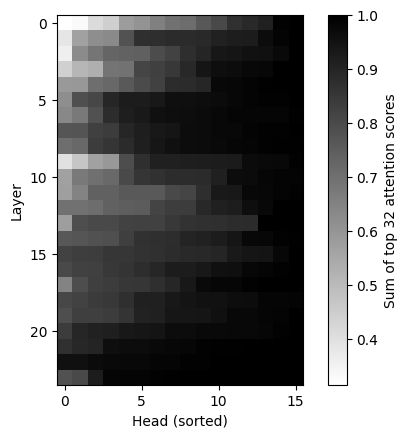

In [49]:
k = 32
topk_metric = torch.topk(A, k=k, dim=-1).values.sum(-1)
ax = plt.gca()
img = ax.imshow(torch.sort(topk_metric.mean(0), dim=1).values, cmap="gray_r", vmax=1)
plt.colorbar(img, ax=ax, label=f"Sum of top {k} attention scores")
ax.set_xlabel("Head (sorted)")
ax.set_ylabel("Layer")
plt.show();

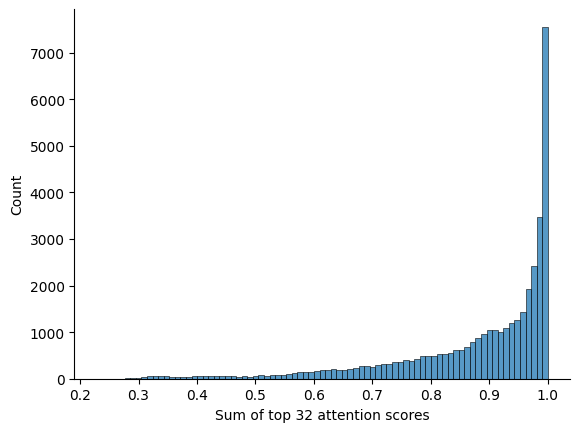

In [50]:
ax = sns.histplot(topk_metric.flatten())
sns.despine(ax=ax)
ax.set_xlabel(f"Sum of top {k} attention scores")
plt.show();

# 2. The indices of the largest attention scores can be predicted without fetching the full $K$ matrix, using the top-magnitude components of $q$

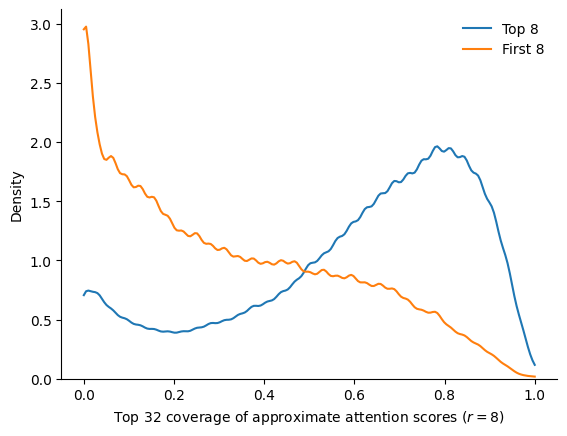

In [51]:
ax = plt.gca()
sns.kdeplot(agreement_top.flatten(), clip=(0, 1), bw_adjust=.5, label=f"Top {rank}", ax=ax)
sns.kdeplot(agreement_first.flatten(), clip=(0, 1), bw_adjust=.5, label=f"First {rank}", ax=ax)
sns.despine(ax=ax)
ax.legend(frameon=False)
ax.set_xlabel(f"Top {k} coverage of approximate attention scores ($r={rank})$")
plt.show()

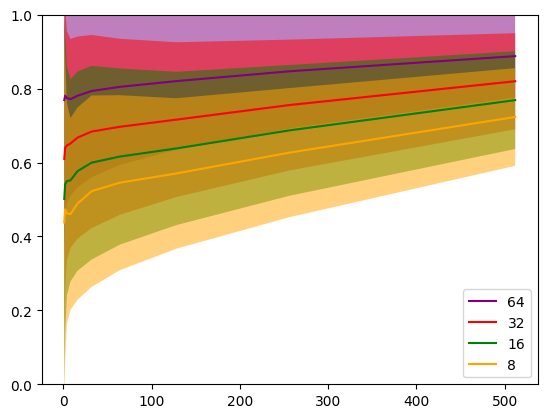

In [52]:
rank = None
k = None
cols = ['purple','red','green','orange','blue']
# agreement_tensors = {}

for i, rank in enumerate([64, 32, 16,8]):
    k_range = [2**k for k in range(10)]
    scores_func = lambda x: topk_agreement(A, approx_score(Q[..., -1:, :], K, M, rank=rank, method="top").squeeze(-2), M.squeeze(-2), k=x)
    # agreement_tensors[rank] = [scores_func(k) for k in k_range]
    agreement_mean = np.array([float(tnsr.mean().numpy()) for tnsr in agreement_tensors[rank]])
    agreement_std = np.array([float(tnsr.std().numpy()) for tnsr in agreement_tensors[rank]])
    plt.fill_between(k_range, agreement_mean+agreement_std, agreement_mean-agreement_std, facecolor=cols[i], alpha=0.5)
    plt.plot(k_range, agreement_mean, label=f"{rank}", c=cols[i])
plt.ylim(0,1)
plt.legend(loc="lower right")
plt.show()

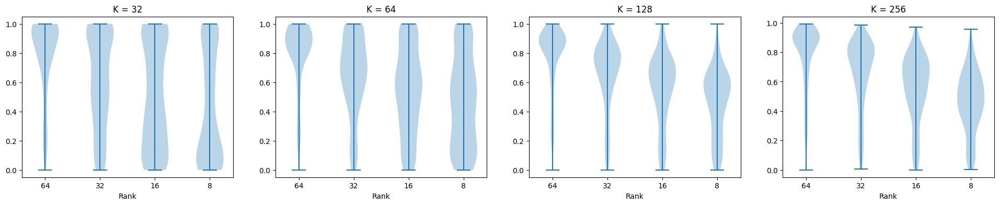

In [53]:
fig, axs = plt.subplots(nrows=1, ncols=len(k_range[5:-1]), figsize=(24, 4))
for i, k in enumerate(k_range[5:-1]):
    axs[i].violinplot([v[i].mean(0).flatten() for v in agreement_tensors.values()])
    axs[i].set_title(f"K = {k}")
    axs[i].set_xticks([y + 1 for y in range(4)],
                  labels=['64', '32', '16', '8'])
    axs[i].set_xlabel('Rank')
    
plt.show()

# 3. KDE of $q$ vectors

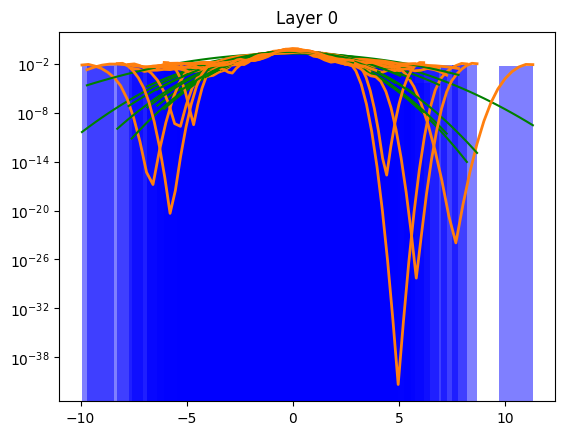

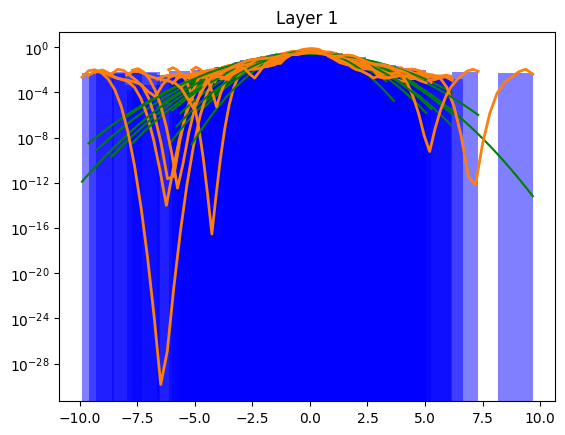

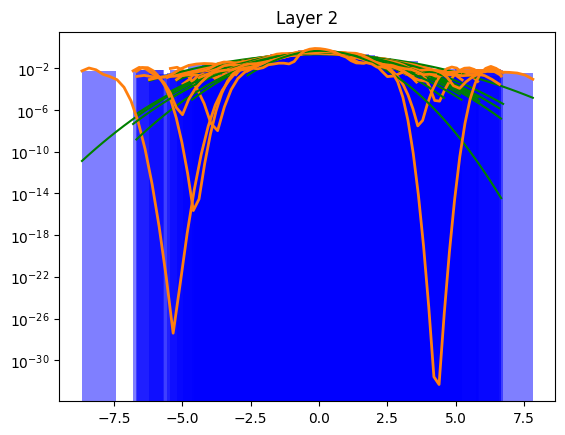

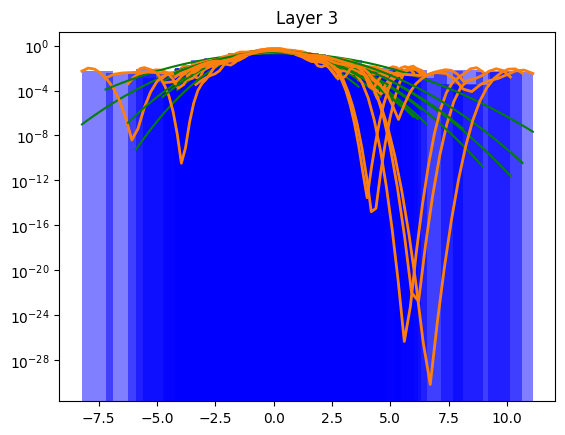

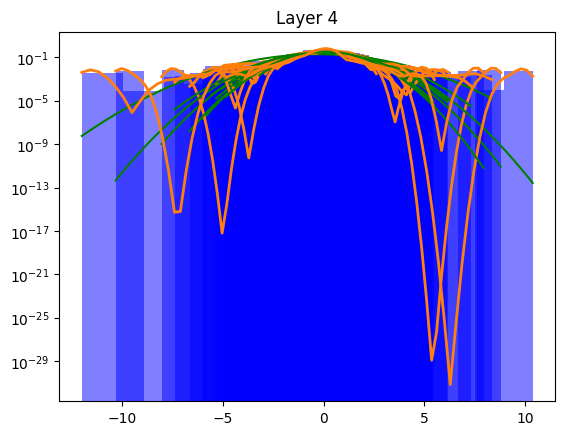

...

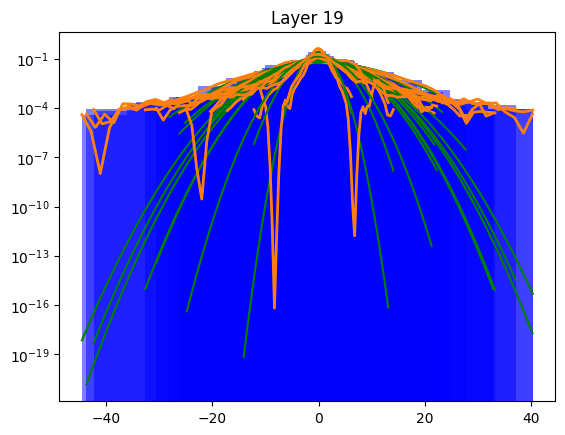

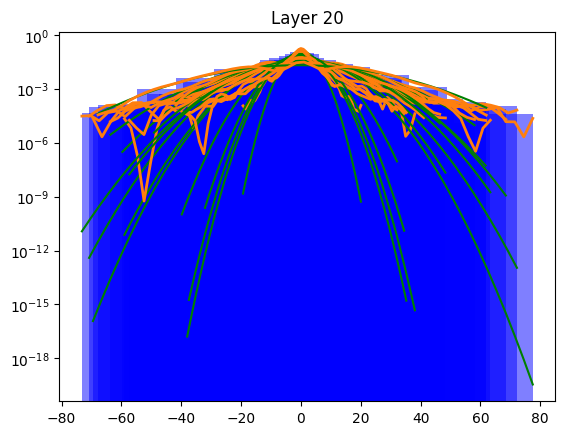

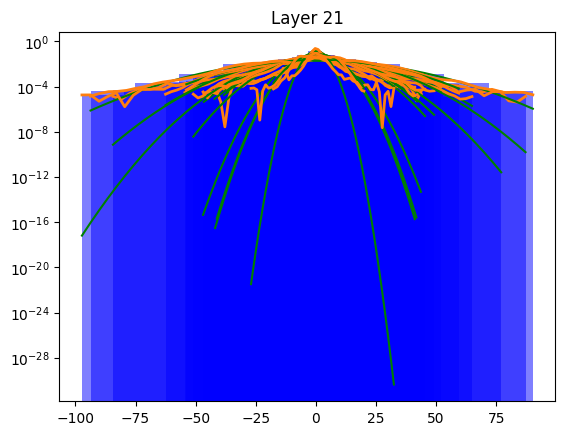

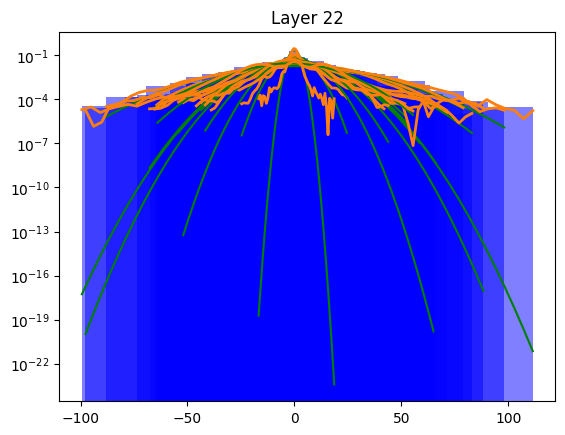

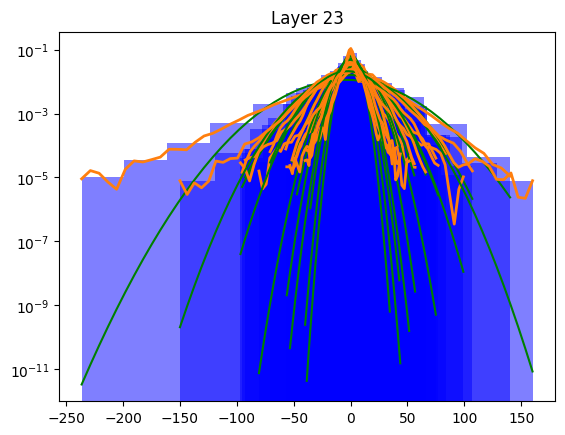

In [54]:
zscores = []
kurtosis = []
outer_mass = []

for j in range(Q.shape[1]):
    for i in range(Q.shape[2]):
        e = torch.flatten(Q[:,j,i,0])
        mean, var = e.mean(), e.var()
        zvec = (e - mean) / np.sqrt(var)
        mask = zvec.abs() > 3.0
        end_mask = torch.masked_fill(torch.zeros(e.shape), mask, 1.0)
        outer_mass.append((end_mask * e).abs().sum() / e.abs().sum())
        x = np.linspace(e.min(), e.max())
        plt.hist(e, density=True, color='blue',alpha=0.5)
        kde = sts.gaussian_kde(e, bw_method="silverman")
        plt.plot(x, sts.norm.pdf(x, mean, np.sqrt(var)), c="green",)
        plt.plot(x, kde.pdf(x), c='C1', lw=2, label='KDE')
        zscores.append(zvec.abs().max())
        kurtosis.append(sts.kurtosis(e, fisher=True, bias=True))
        plt.yscale("log")
        plt.title(f"Layer {j}")
    plt.show()

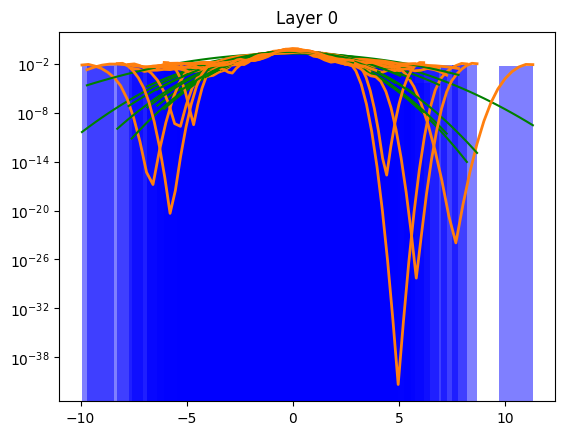

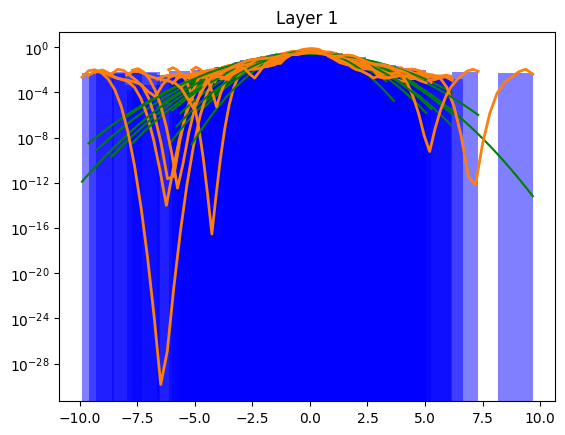

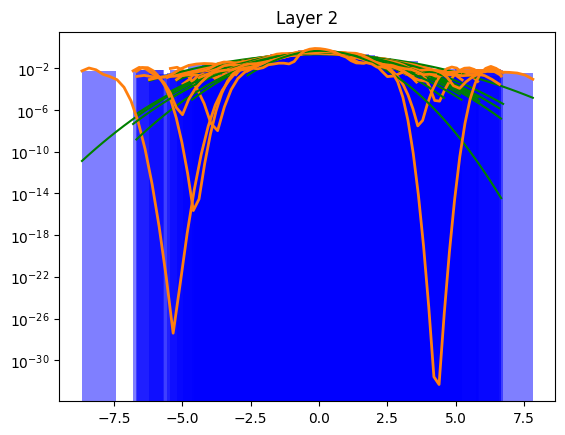

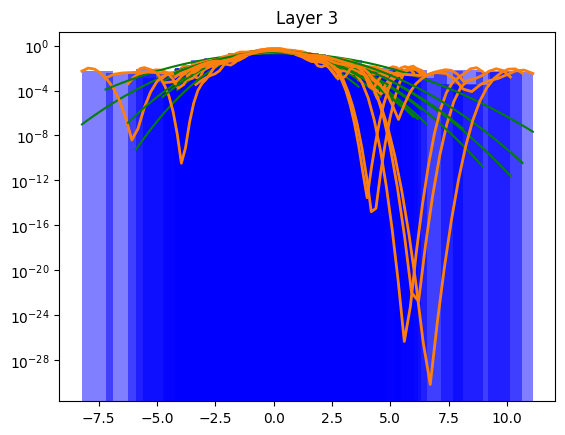

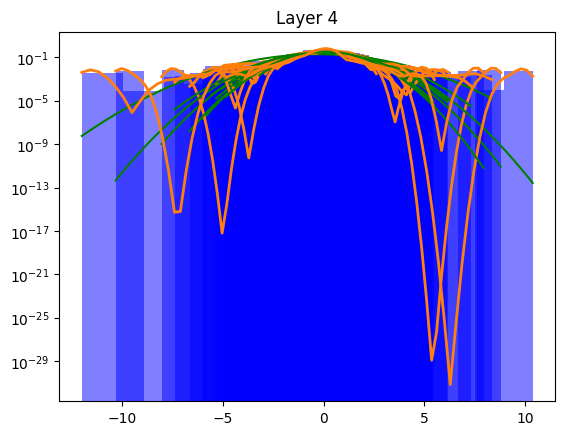

...

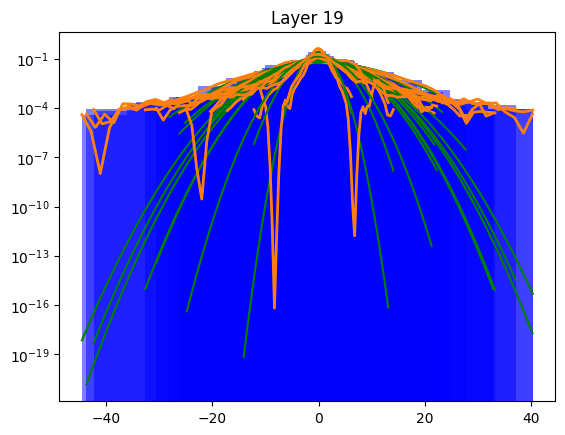

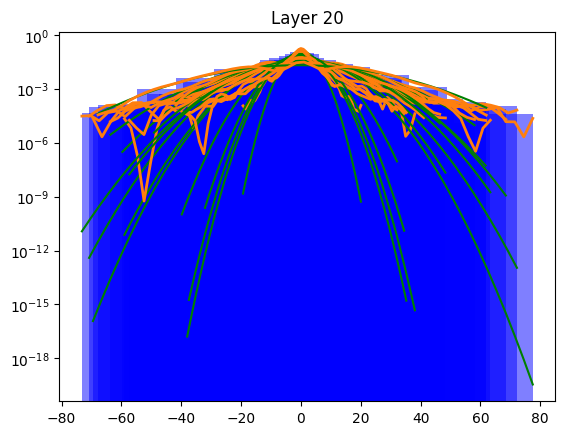

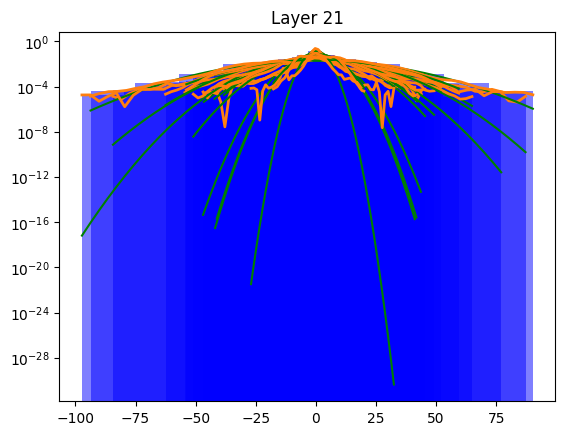

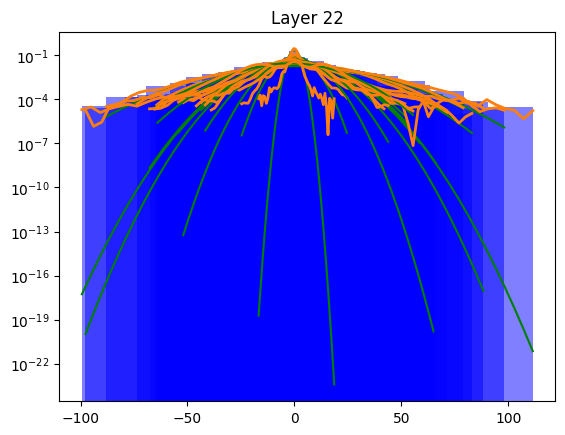

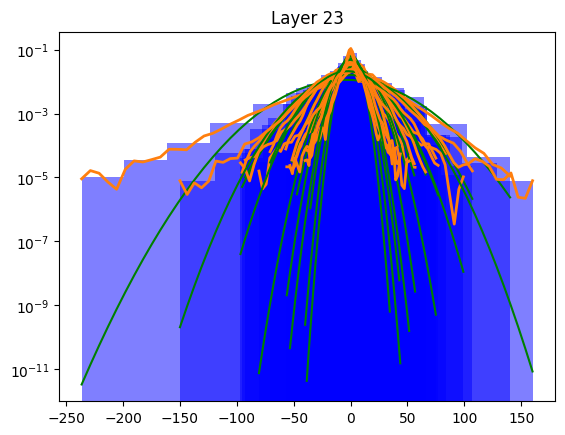

In [55]:
for j in range(K.shape[1]):
    for i in range(Q.shape[2]):
        e = torch.flatten(Q[:,j,i,0])
        mean, var = e.mean(), e.var()
        zvec = (e - mean) / np.sqrt(var)
        mask = zvec.abs() > 3.0
        end_mask = torch.masked_fill(torch.zeros(e.shape), mask, 1.0)
        outer_mass.append((end_mask * e).abs().sum() / e.abs().sum())
        x = np.linspace(e.min(), e.max())
        plt.hist(e, density=True, color='blue',alpha=0.5)
        kde = sts.gaussian_kde(e, bw_method="silverman")
        plt.plot(x, sts.norm.pdf(x, mean, np.sqrt(var)), c="green",)
        plt.plot(x, kde.pdf(x), c='C1', lw=2, label='KDE')
        zscores.append(zvec.abs().max())
        kurtosis.append(sts.kurtosis(e, fisher=True, bias=True))
        plt.yscale("log")
        plt.title(f"Layer {j}")
    plt.show()

In [56]:
torch.set_printoptions(profile='full')

In [57]:
zvec.abs()

tensor([1.4044e-01, 1.2903e-01, 3.8094e-01, 5.4442e-02, 3.3396e-01, 3.2606e-01,
        1.1733e-01, 1.2180e-01, 2.6986e-01, 2.3487e-01, 5.0285e-02, 2.9012e-02,
        2.2005e+00, 1.0080e-01, 3.2280e-01, 1.2750e-01, 1.9271e-01, 1.2953e-01,
        2.0587e-02, 1.4839e-01, 3.4369e-02, 6.0028e-02, 2.9536e-01, 9.9039e-02,
        5.0819e-01, 1.0394e-01, 4.4801e-01, 1.0279e-01, 5.1546e-01, 8.1334e-02,
        2.0061e-02, 1.9143e-01, 3.2440e-01, 5.6692e-01, 1.0162e+00, 6.9475e-01,
        1.0001e+00, 7.6493e-01, 2.5650e-01, 9.3448e-01, 4.6444e-01, 7.9959e-01,
        6.7518e-01, 1.5365e+00, 7.4817e-01, 1.2040e+00, 8.3088e-01, 4.4171e-01,
        7.1832e-01, 1.2488e+00, 1.3338e+00, 3.7674e-01, 7.9008e-01, 8.6252e-01,
        1.6002e+00, 7.3803e-01, 7.1045e-01, 1.2226e+00, 1.2780e+00, 4.7128e-01,
        5.1323e-01, 4.3350e-02, 6.7882e-01, 1.1563e+00, 8.7058e-01, 6.3586e-01,
        1.1596e+00, 1.2169e+00, 1.2966e+00, 9.9265e-01, 1.1566e-01, 1.1209e+00,
        1.5610e-01, 8.5969e-01, 8.7215e-

In [58]:
img = plt.imshow(torch.sort(torch.Tensor(outer_mass).view(24,16)).values, cmap="gray_r", vmin=0, vmax=0.25)
plt.colorbar(img, shrink=.82, format=lambda x, _: f"{x*100:.0f}%")
plt.title("|z| > 3.0 q-vector mass")

RuntimeError: shape '[24, 16]' is invalid for input of size 768

In [ ]:
from matplotlib.colors import LogNorm
img = plt.imshow(torch.sort(torch.Tensor(outer_mass).view(24,16)).values/0.0026, cmap="gist_rainbow", norm=LogNorm(vmin=1, vmax=102))
plt.colorbar(img, shrink=.82, format=lambda x, _: f"{x:.0f}x")
plt.title("|z| > 3.0 q-vector mass vs normal distribution (Pythia 1.4)")

In [ ]:
torch.sort(torch.Tensor(outer_mass).view(24,16)).values.max()

In [ ]:
plt.scatter(np.arange(len(zscores)), zscores)
plt.axhline(y=3, color='r', linestyle='-')
plt.title("Max z-value")

In [ ]:
plt.scatter(np.arange(len(kurtosis)), kurtosis)
plt.axhline(y=0.0, color='r', linestyle='-')
plt.title("Kurtosis (Fisher) for LLama")

In [ ]:
plt.boxplot(kurtosis)

### Pythia 6.9B

In [ ]:
def attention_weight(q: Tensor, k: Tensor, mask: Tensor) -> Tensor:
    a = (q @ k.transpose(-1, -2)).mul_(q.shape[-1]**-0.5).add_(mask)
    return torch.nn.functional.softmax(a, dim=-1)

Q_6_9b = torch.stack(list(log_q.values())).swapaxes(0, 1)[..., -1:, :]
K_6_9b = torch.stack(list(log_k.values())).swapaxes(0, 1)
M_6_9b = torch.stack(list(log_m.values())).swapaxes(0, 1)
A_6_9b = attention_weight(Q_6_9b, K_6_9b, M_6_9b).squeeze(-2)
A_6_9b.shape

In [ ]:
print(1)

In [ ]:
print(1)

In [ ]:
print(1)

In [ ]:
class Resources_1:
    def __init__(wood):
        self.wood = wood

    def collect(wood):
        self.wood += wood
        return True
        
    def build(wood):
        if wood > self.wood:
            return False
        self.wood -= wood
        return True

In [ ]:
import heapq

class Resources_2:
    def __init__(wood):
        self.wood = wood
        self.queue = []

    def collect(wood):
        self.wood += wood
        while self.queue[0] and self.wood >= self.queue[0]:
            queue_wood = heapq.heappop(self.queue)
            self.build(queue_wood)
        return True
        
    def build(wood):
        if wood > self.wood:
            heapq.heappush(wood, self.queue)
            return False
        self.wood -= wood
        return True

In [16]:
import random

queue = []

for i in range(20):
    queue += [(random.randint(0,10), random.randint(0,10))]

In [25]:
[a for a in dir(adapter.model) if 'named' in a]

['_named_members',
 'named_buffers',
 'named_children',
 'named_modules',
 'named_parameters']

In [17]:
adapter.model.gpt_neox.embed_in.weight, torch.norm(adapter.model.gpt_neox.embed_in.weight)

(Parameter containing:
 tensor([[-5.5838e-04,  1.1653e-04, -4.0174e-04,  ..., -7.0572e-04,
          -1.8291e-03,  6.6614e-04],
         [-4.4656e-04,  6.6376e-04,  5.1727e-03,  ..., -6.9237e-04,
          -5.9586e-03, -2.3136e-03],
         [-3.3478e-02,  1.0460e-02,  6.7520e-03,  ...,  6.3858e-03,
           4.2084e-02,  1.0986e-02],
         ...,
         [ 2.6302e-03, -3.7670e-03,  6.1302e-03,  ..., -3.4869e-05,
          -1.4954e-03, -2.1477e-03],
         [-1.9703e-03,  1.5106e-03,  2.5635e-03,  ..., -2.7676e-03,
          -3.2377e-04, -5.5466e-03],
         [ 4.8280e-06, -1.1330e-03,  1.2884e-03,  ...,  2.7790e-03,
           2.2945e-03,  2.6560e-04]], requires_grad=True),
 tensor(216.7871, grad_fn=<LinalgVectorNormBackward0>))

In [23]:
adapter.model.gpt_neox.embed_in.weight.data.normal_(mean=0.0, std=0.02)

tensor([[ 0.0185,  0.0521,  0.0335,  ..., -0.0064,  0.0393,  0.0117],
        [ 0.0045,  0.0019, -0.0526,  ...,  0.0041, -0.0243,  0.0215],
        [ 0.0166,  0.0161, -0.0276,  ...,  0.0123, -0.0046, -0.0318],
        ...,
        [-0.0075,  0.0215,  0.0245,  ..., -0.0377,  0.0303, -0.0058],
        [ 0.0318, -0.0131,  0.0235,  ...,  0.0034,  0.0131,  0.0377],
        [ 0.0193, -0.0398,  0.0118,  ..., -0.0235, -0.0066, -0.0222]])

In [24]:
adapter.model.gpt_neox.embed_in.weight, torch.norm(adapter.model.gpt_neox.embed_in.weight)

(Parameter containing:
 tensor([[ 0.0185,  0.0521,  0.0335,  ..., -0.0064,  0.0393,  0.0117],
         [ 0.0045,  0.0019, -0.0526,  ...,  0.0041, -0.0243,  0.0215],
         [ 0.0166,  0.0161, -0.0276,  ...,  0.0123, -0.0046, -0.0318],
         ...,
         [-0.0075,  0.0215,  0.0245,  ..., -0.0377,  0.0303, -0.0058],
         [ 0.0318, -0.0131,  0.0235,  ...,  0.0034,  0.0131,  0.0377],
         [ 0.0193, -0.0398,  0.0118,  ..., -0.0235, -0.0066, -0.0222]],
        requires_grad=True),
 tensor(200.6279, grad_fn=<LinalgVectorNormBackward0>))

In [ ]:
# for param in adapter.model.named_parameters():
#    if "weight" in param[0]:
#        param[1].data.normal_(mean=0.0, std=0.02)
#    elif 'bias' in param[0]:
#        param[1].data.zero_()

In [37]:
def attention_weight(q: Tensor, k: Tensor, mask: Tensor) -> Tensor:
    a = (q @ k.transpose(-1, -2)).mul_(q.shape[-1]**-0.5).add_(mask)
    return torch.nn.functional.softmax(a, dim=-1)

Q_init = torch.stack(list(log_q.values())).swapaxes(0, 1)[..., -1:, :]
K_init = torch.stack(list(log_k.values())).swapaxes(0, 1)
M_init = torch.stack(list(log_m.values())).swapaxes(0, 1)
A_init = attention_weight(Q_init, K_init, M_init).squeeze(-2)
A_init.shape

torch.Size([20, 24, 16, 2048])

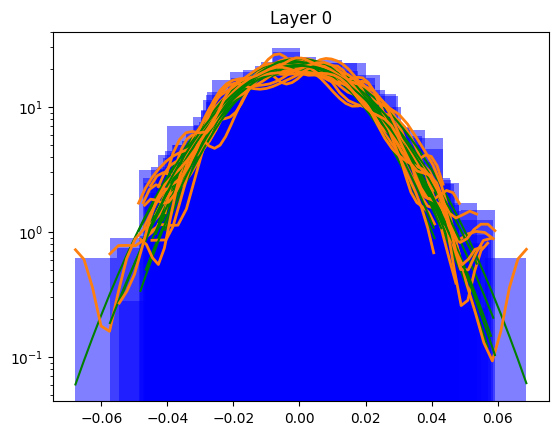

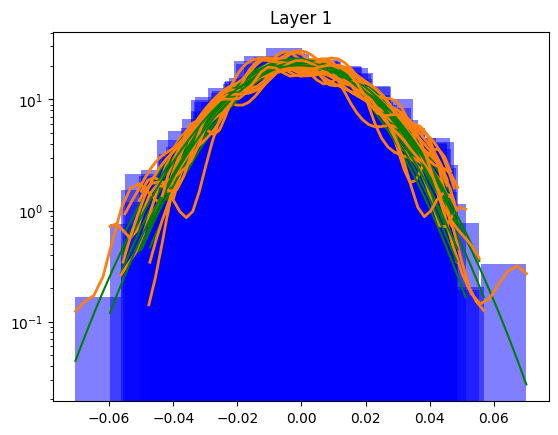

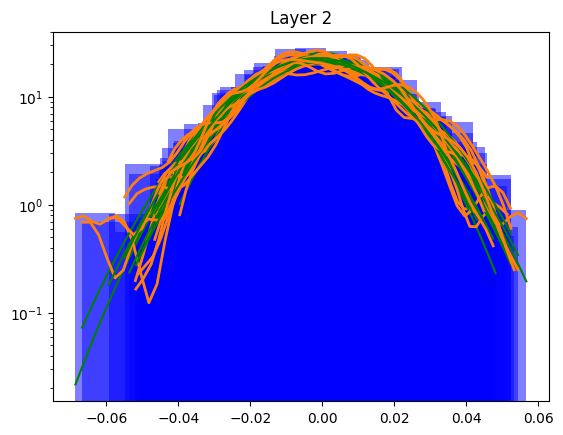

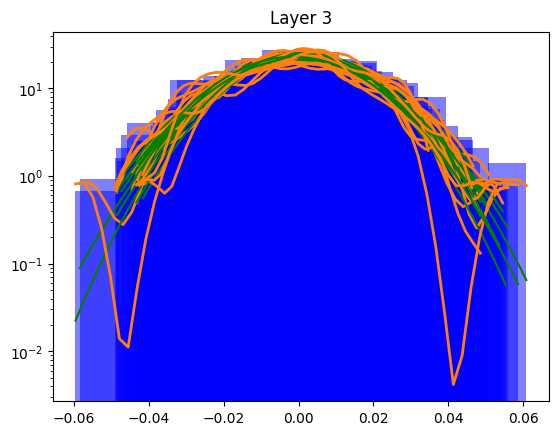

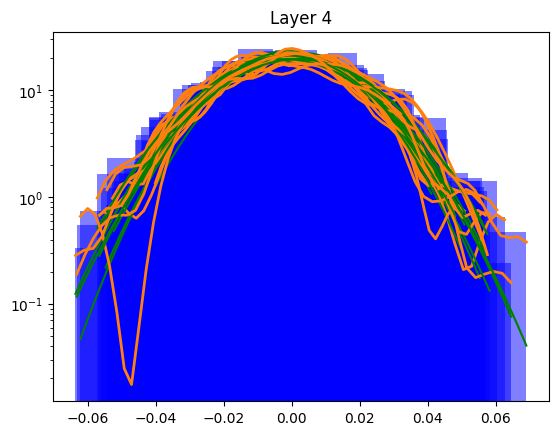

...

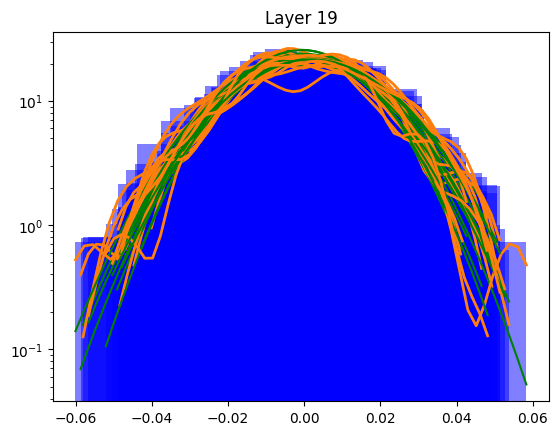

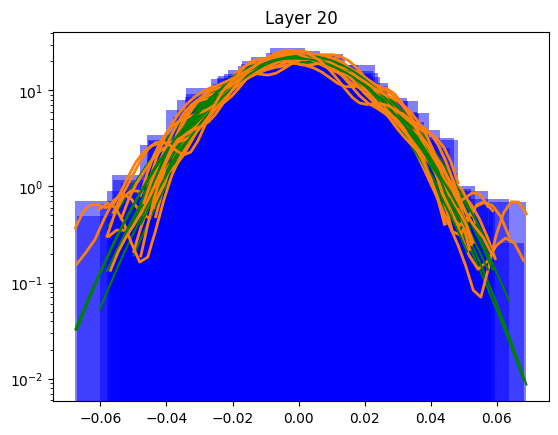

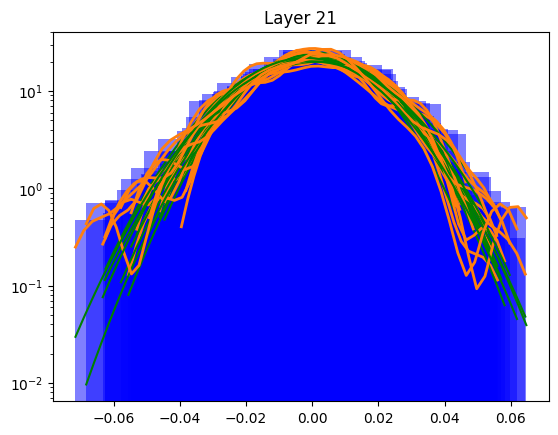

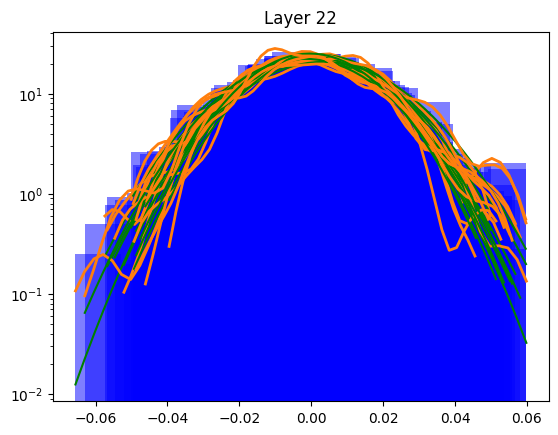

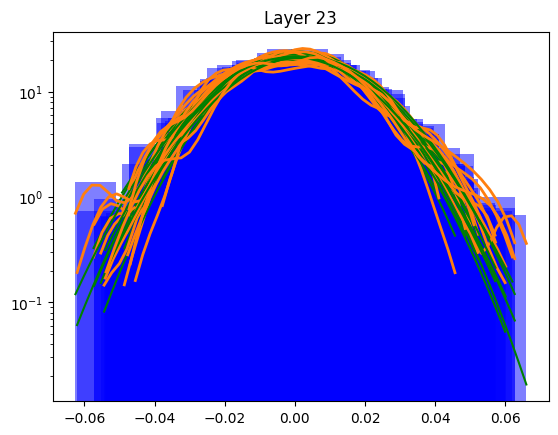

In [38]:
zscores = []
kurtosis = []
outer_mass = []

for j in range(Q_init.shape[1]):
    for i in range(Q_init.shape[2]):
        e = torch.flatten(Q_init[:,j,i,0])
        mean, var = e.mean(), e.var()
        zvec = (e - mean) / np.sqrt(var)
        mask = zvec.abs() > 3.0
        end_mask = torch.masked_fill(torch.zeros(e.shape), mask, 1.0)
        outer_mass.append((end_mask * e).abs().sum() / e.abs().sum())
        x = np.linspace(e.min(), e.max())
        plt.hist(e, density=True, color='blue',alpha=0.5)
        kde = sts.gaussian_kde(e, bw_method="silverman")
        plt.plot(x, sts.norm.pdf(x, mean, np.sqrt(var)), c="green",)
        plt.plot(x, kde.pdf(x), c='C1', lw=2, label='KDE')
        zscores.append(zvec.abs().max())
        kurtosis.append(sts.kurtosis(e, fisher=True, bias=True))
        plt.yscale("log")
        plt.title(f"Layer {j}")
    plt.show()

In [64]:
Q_init.shape, K_init.shape

(torch.Size([20, 24, 16, 1, 128]), torch.Size([20, 24, 16, 2048, 128]))

In [46]:
A_init.shape, A.shape

(torch.Size([20, 24, 16, 2048]), torch.Size([20, 24, 16, 2048]))

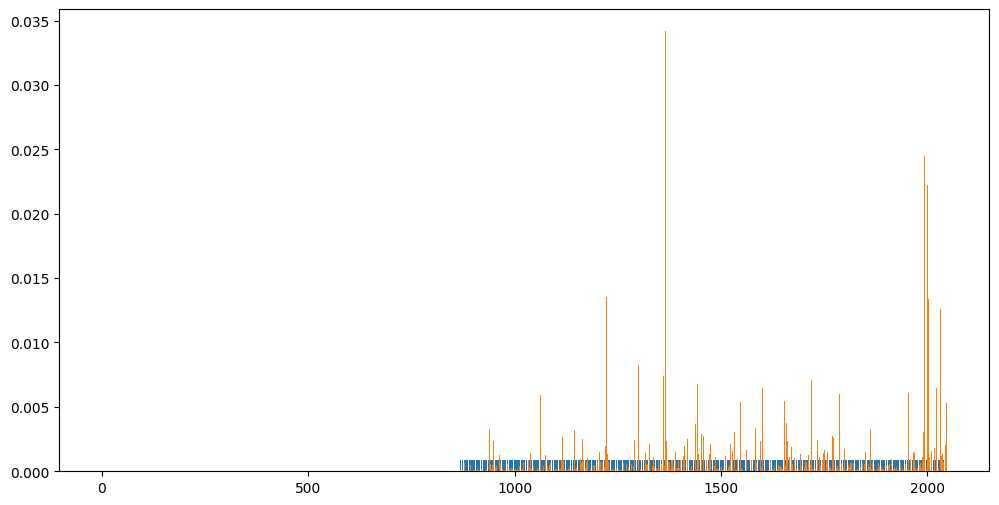

In [59]:
plt.figure(figsize=(12,6))
plt.bar(list(range(2048)),height=A_init[0,1,2])
plt.bar(list(range(2048)),height=A[0,1,2])
plt.show()

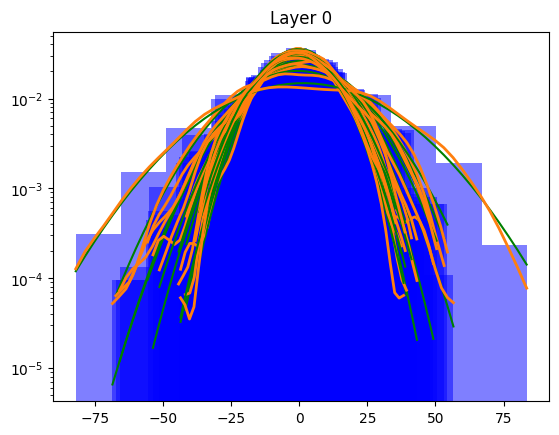

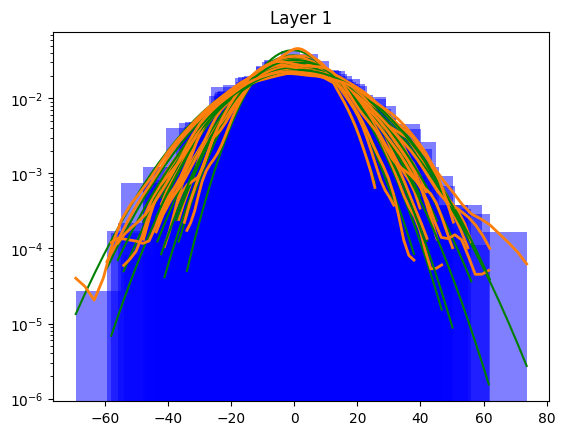

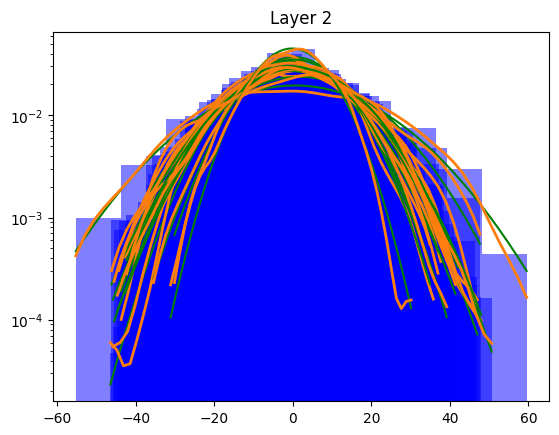

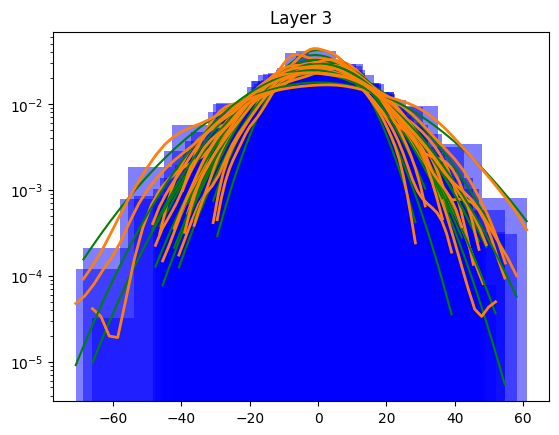

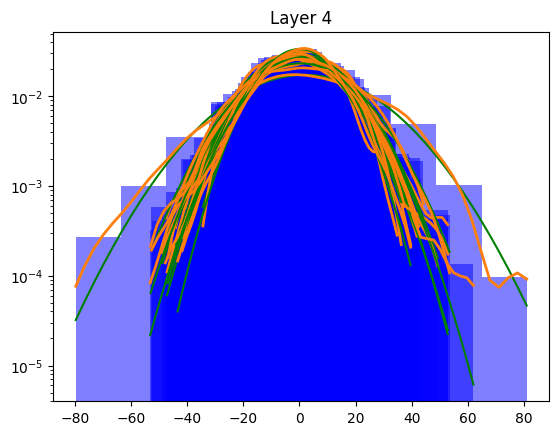

...

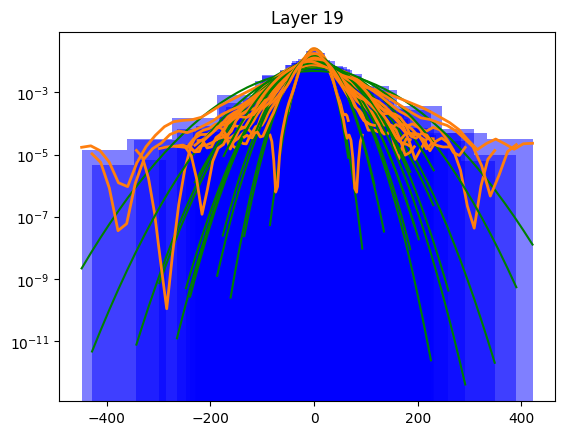

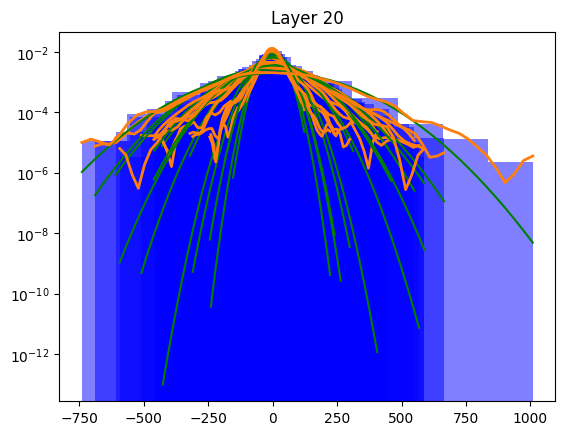

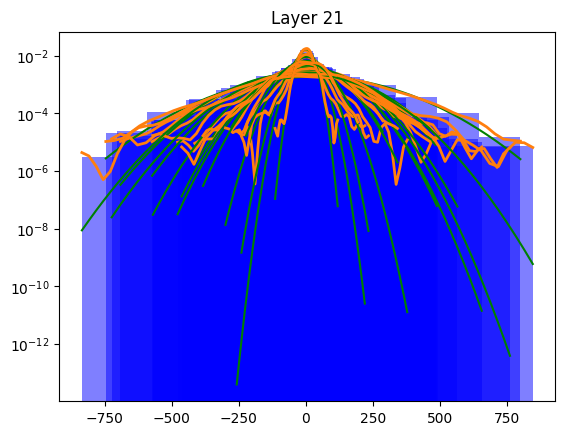

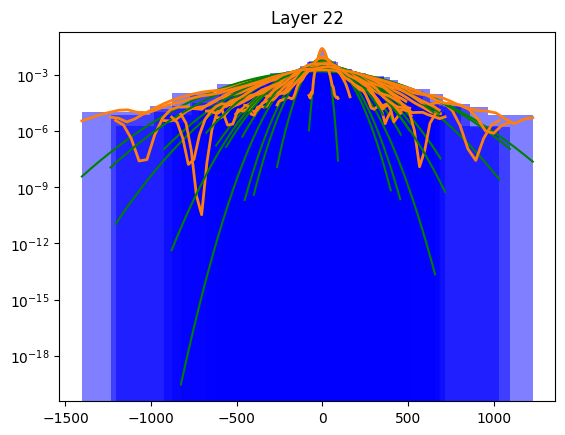

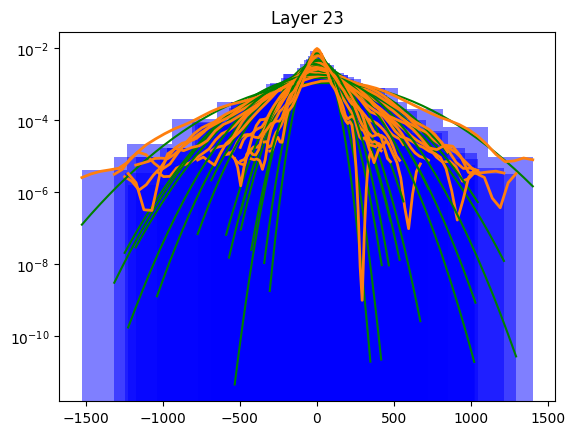

In [68]:
zscores = []
kurtosis = []
outer_mass = []
q_rand = Q @ torch.normal(0, 1, (Q.shape[-1], Q.shape[-1]))
for j in range(q_rand.shape[1]):
    for i in range(q_rand.shape[2]):
        e = torch.flatten(q_rand[:,j,i,0])
        mean, var = e.mean(), e.var()
        zvec = (e - mean) / np.sqrt(var)
        mask = zvec.abs() > 3.0
        end_mask = torch.masked_fill(torch.zeros(e.shape), mask, 1.0)
        outer_mass.append((end_mask * e).abs().sum() / e.abs().sum())
        x = np.linspace(e.min(), e.max())
        plt.hist(e, density=True, color='blue',alpha=0.5)
        kde = sts.gaussian_kde(e, bw_method="silverman")
        plt.plot(x, sts.norm.pdf(x, mean, np.sqrt(var)), c="green",)
        plt.plot(x, kde.pdf(x), c='C1', lw=2, label='KDE')
        zscores.append(zvec.abs().max())
        kurtosis.append(sts.kurtosis(e, fisher=True, bias=True))
        plt.yscale("log")
        plt.title(f"Layer {j}")
    plt.show()

In [ ]:
Q @ torch.normal(0, 1, (Q.shape[-1], Q.shape[-1]))

In [69]:
def attention_weight(q: Tensor, k: Tensor, mask: Tensor) -> Tensor:
    a = (q @ k.transpose(-1, -2)).mul_(q.shape[-1]**-0.5).add_(mask)
    return torch.nn.functional.softmax(a, dim=-1)

q_rand = Q @ torch.normal(0, 1, (Q.shape[-1], Q.shape[-1]))

A_rand = attention_weight(q_rand, K, M).squeeze(-2)
A_rand.shape

torch.Size([20, 24, 16, 2048])

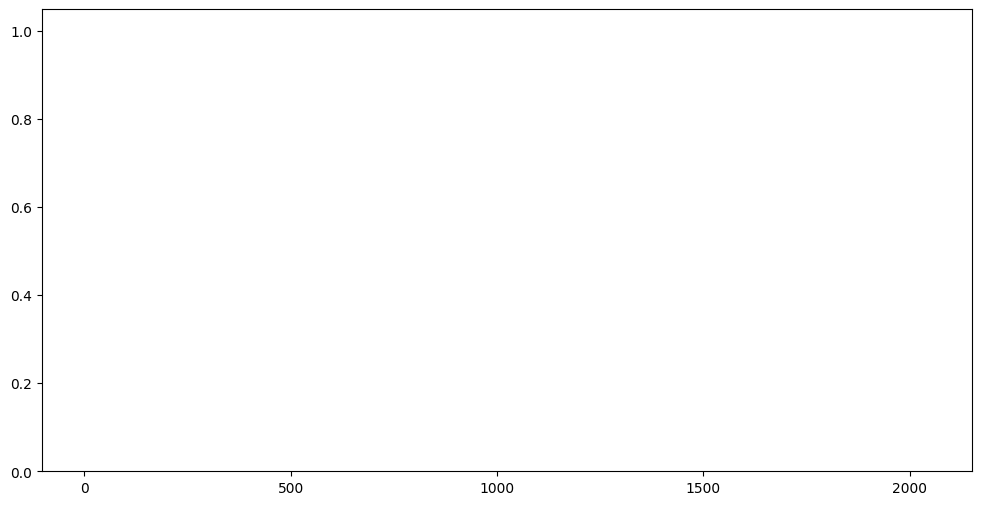

In [72]:
plt.figure(figsize=(12,6))
plt.bar(list(range(2048)),height=A_rand[0,1,1])
plt.show()

In [ ]:
A_rand[0,1,9]

## LLama

In [ ]:
adapter_llama = L.Adapter.from_pretrained("meta-llama/Llama-2-7b-hf")

def convert(model: LlamaForCausalLM) -> LlamaForCausalLM:
    def _replace(m: torch.nn.Module) -> Optional[torch.nn.Module]:
        if isinstance(m, LlamaAttention):
            return L.models.llama_attention.LlamaAttention(model.config)

    return L.utility.convert_module(model, _replace)

adapter_llama.model = convert(adapter_llama.model)
hasattr(adapter_llama.model.model.layers[0].self_attn, "_attn")

In [ ]:
log_q = {}
log_k = {}
log_m = {}
def logging_attn(layer_idx, self, query, key, value, attention_mask=None):
    q = torch.nn.functional.pad(query, [0, 0, 2048 - query.shape[2], 0, 0, 0, 0, 0])
    k = torch.nn.functional.pad(key, [0, 0, 2048 - key.shape[2], 0, 0, 0, 0, 0])
    # m = torch.nn.functional.pad(attention_mask, [2048 - key.shape[2], 0, 0, 0, 0, 0], value=-1e9)
    
    log_q[layer_idx] = torch.concat([log_q[layer_idx], q], axis=0) if layer_idx in log_q else q
    log_k[layer_idx] = torch.concat([log_k[layer_idx], k], axis=0) if layer_idx in log_k else k
    # log_m[layer_idx] = torch.concat([log_m[layer_idx], m], axis=0) if layer_idx in log_m else m
    return L.models.llama_attention.LlamaAttention._attn(self, query, key, value, attention_mask=attention_mask)

for layer_idx, layer in enumerate(adapter_llama.model.model.layers):
    layer.self_attn._attn = partial(logging_attn, layer_idx, layer.self_attn)
out = list(L.tasks.qa.evaluate(adapter_llama, examples[:20], batch_size=1, output_token_limit=1))

In [48]:
def attention_weight(q: Tensor, k: Tensor, mask: Tensor) -> Tensor:
    a = (q @ k.transpose(-1, -2)).mul_(q.shape[-1]**-0.5).add_(mask)
    return torch.nn.functional.softmax(a, dim=-1)

Q_llama = torch.stack(list(log_q.values())).swapaxes(0, 1)[..., -1:, :]
K_llama = torch.stack(list(log_k.values())).swapaxes(0, 1)

In [49]:
import scipy.stats as sts
import numpy as np

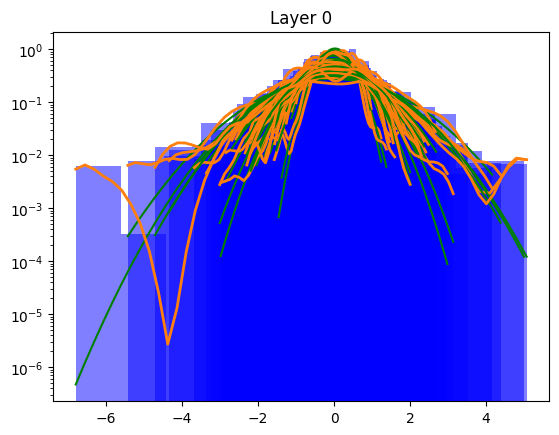

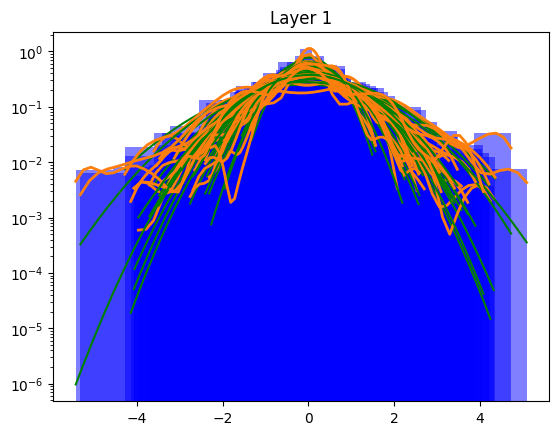

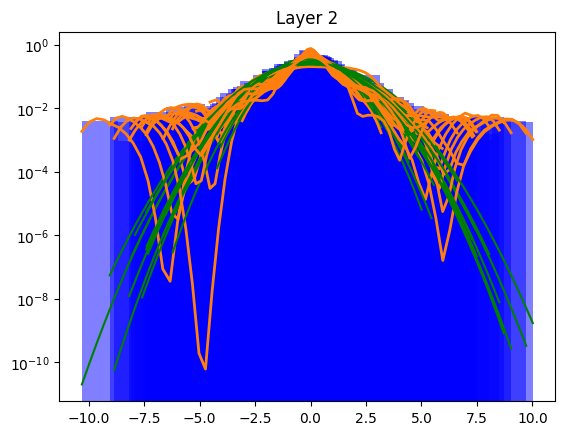

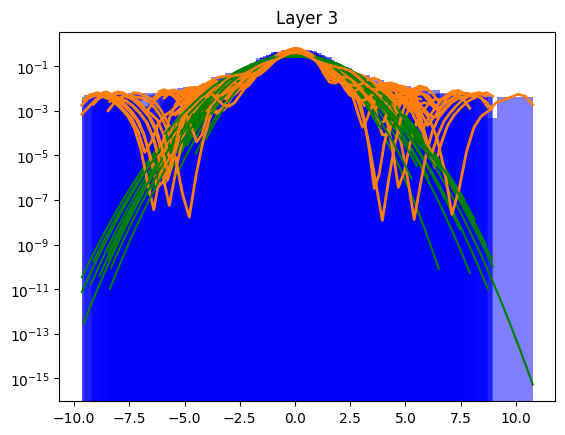

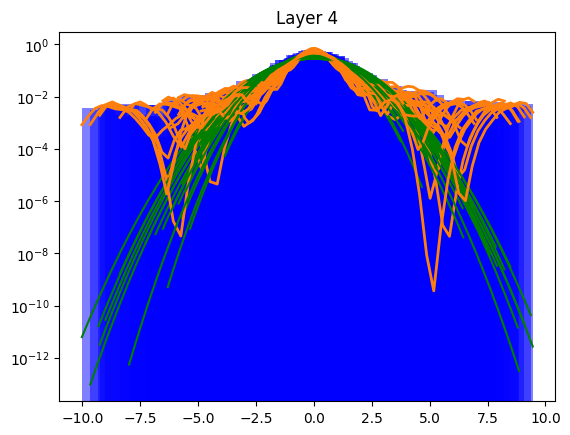

...

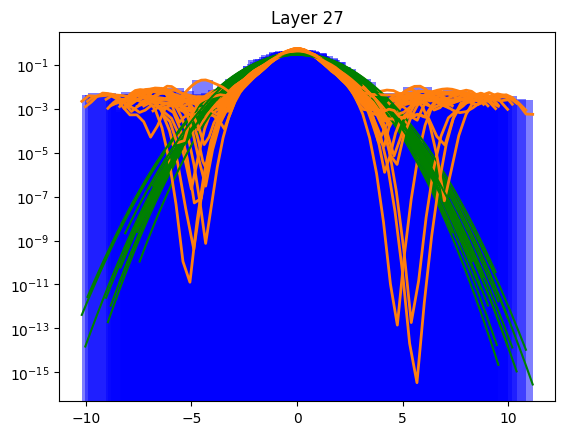

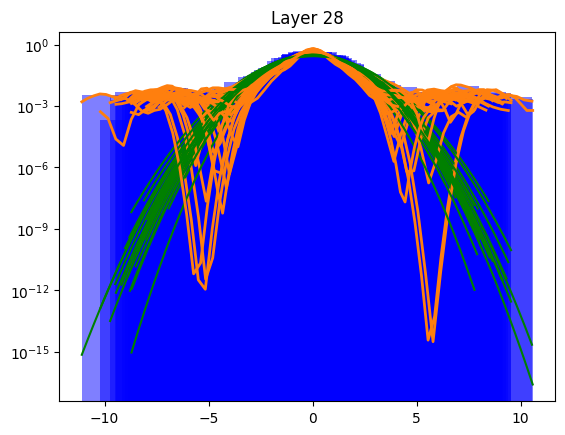

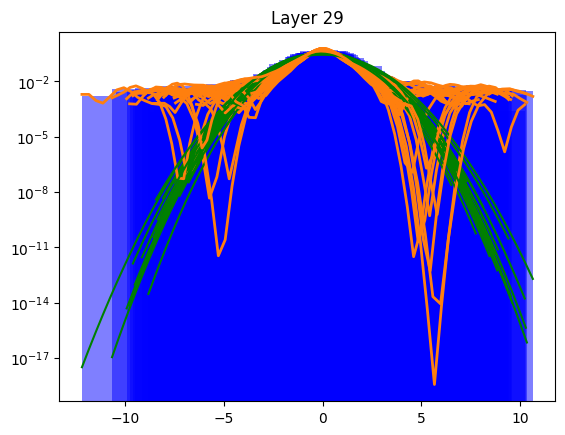

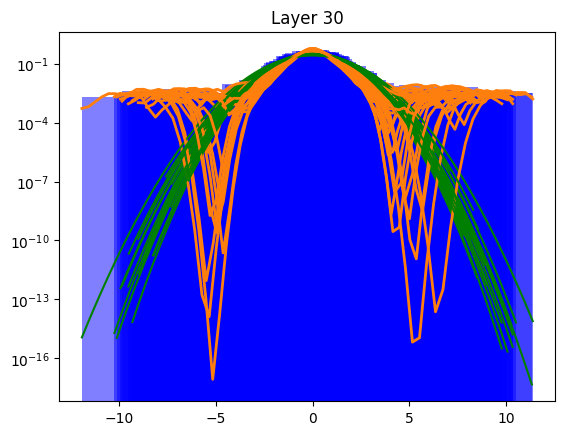

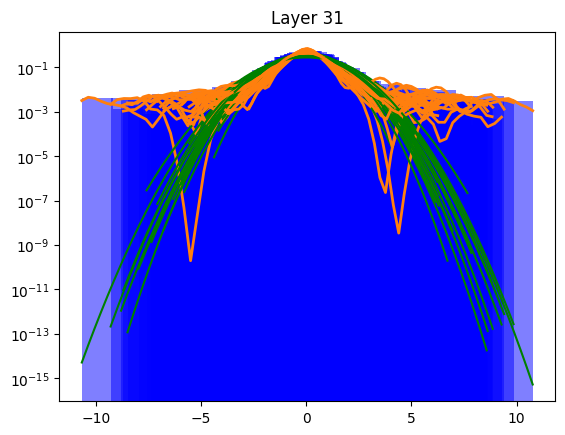

In [65]:
zscores = []
kurtosis = []
outer_mass = []

for j in range(Q_llama.shape[1]):
    for i in range(Q_llama.shape[2]):
        e = torch.flatten(Q_llama[:,j,i,0])
        mean, var = e.mean(), e.var()
        zvec = (e - mean) / np.sqrt(var)
        mask = zvec.abs() > 3.0
        end_mask = torch.masked_fill(torch.zeros(e.shape), mask, 1.0)
        outer_mass.append((end_mask * e).abs().sum() / e.abs().sum())
        x = np.linspace(e.min(), e.max())
        plt.hist(e, density=True, color='blue',alpha=0.5)
        kde = sts.gaussian_kde(e, bw_method="silverman")
        plt.plot(x, sts.norm.pdf(x, mean, np.sqrt(var)), c="green",)
        plt.plot(x, kde.pdf(x), c='C1', lw=2, label='KDE')
        zscores.append(zvec.abs().max())
        kurtosis.append(sts.kurtosis(e, fisher=True, bias=True))
        plt.yscale("log")
        plt.title(f"Layer {j}")
    plt.show()

In [ ]:
torch.Tensor(outer_mass)/0.0026

Text(0.5, 1.0, '|z| > 3.0 q-vector mass')

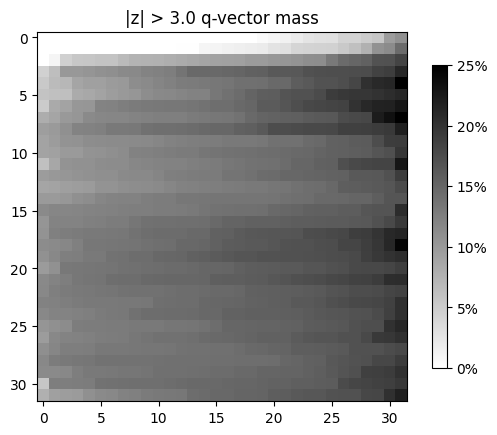

In [57]:
img = plt.imshow(torch.sort(torch.Tensor(outer_mass).view(32,32)).values, cmap="gray_r", vmin=0, vmax=0.25)
plt.colorbar(img, shrink=.82, format=lambda x, _: f"{x*100:.0f}%")
plt.title("|z| > 3.0 q-vector mass")

Text(0.5, 1.0, '|z| > 3.0 q-vector mass vs normal distribution (Llama)')

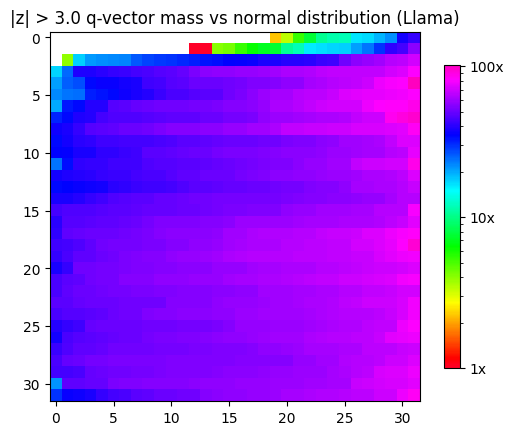

In [82]:
from matplotlib.colors import LogNorm
img = plt.imshow(torch.sort(torch.Tensor(outer_mass).view(32,32)).values/0.0026, cmap="gist_rainbow", norm=LogNorm(vmin=1, vmax=102))
plt.colorbar(img, shrink=.82, format=lambda x, _: f"{x:.0f}x")
plt.title("|z| > 3.0 q-vector mass vs normal distribution (Llama)")